# FARGOpy
## Wrapping FARGO3D

In [1]:
import fargopy as fp
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd
import plotly.graph_objects as go

%load_ext autoreload
%autoreload 2

Once downloaded, we need to connect a `Simulation` object to the directory containing the simulation results:

In [2]:
fp.Simulation.download_precomputed(setup='p3disoj')

Precomputed output directory '/tmp/p3disoj' already exist


'/tmp/p3disoj'

In [3]:
sim = fp.Simulation(output_dir='/tmp/p3disoj')

FARGO3D directory '/Users/jzuluaga/fargo3d/' does not exist.
Now you are connected with output directory '/tmp/p3disoj'
Found a variables.par file in '/tmp/p3disoj', loading properties
Loading variables
85 variables loaded
Simulation in 3 dimensions
Loading domain in spherical coordinates:
	Variable phi: 128 [[0, np.float64(-3.117048960983623)], [-1, np.float64(3.117048960983623)]]
	Variable r: 64 [[0, np.float64(0.5078125)], [-1, np.float64(1.4921875)]]
	Variable theta: 32 [[0, np.float64(1.4231400767948967)], [-1, np.float64(1.5684525767948965)]]
Number of snapshots in output directory: 11
Planets found in summary.dat:
  Name: Jupiter, Distance: 1.0, Mass: 0.001
Configuration variables and domains load into the object. See e.g. <sim>.vars


# **1D Interpolation**

In [4]:
data1d = sim.load_field(
    fields='gasdens',
    snapshot=10,
    slice='phi=0,theta=1.56',
    interpolate=True
)

gasdens = data1d.gasdens_mesh[0]
r_data = np.sqrt(data1d.var1_mesh[0]**2 + data1d.var2_mesh[0]**2 + data1d.var3_mesh[0]**2)


In [5]:
resf = 2

df_resampled = data1d.copy()
# Subsample the mesh arrays for lower resolution
df_resampled['var1_mesh'] = df_resampled['var1_mesh'].apply(lambda arr: arr[::resf])
df_resampled['var2_mesh'] = df_resampled['var2_mesh'].apply(lambda arr: arr[::resf])
df_resampled['var3_mesh'] = df_resampled['var3_mesh'].apply(lambda arr: arr[::resf])
df_resampled['gasdens_mesh'] = df_resampled['gasdens_mesh'].apply(lambda arr: arr[::resf])

In [6]:
r_resampled = np.sqrt(df_resampled.var1_mesh[0]**2 + df_resampled.var2_mesh[0]**2 + df_resampled.var3_mesh[0]**2)
gasdens_resampled = df_resampled.gasdens_mesh[0]

In [7]:
dens1d_interp = data1d.evaluate(
    time=10,
    dataframe=df_resampled,
    var1=r_data,
)

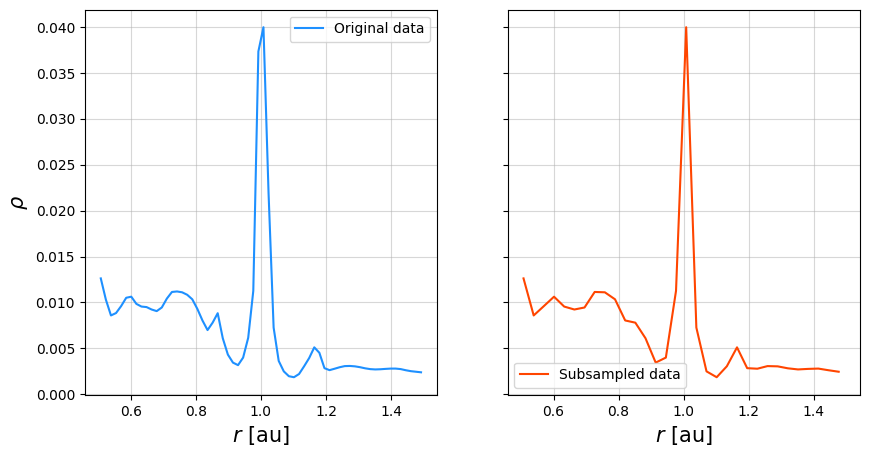

In [8]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True)
axs[0].plot(r_data, gasdens, color='dodgerblue', label='Original data')
axs[1].plot(r_resampled, gasdens_resampled, color='orangered', label='Subsampled data')

for i in range(2):
    axs[i].grid(alpha=0.5)
    axs[i].legend()
    axs[i].set_xlabel(f'$r$ [au]', size=15)
    axs[0].set_ylabel(r'$\rho$', size=15)

plt.show()

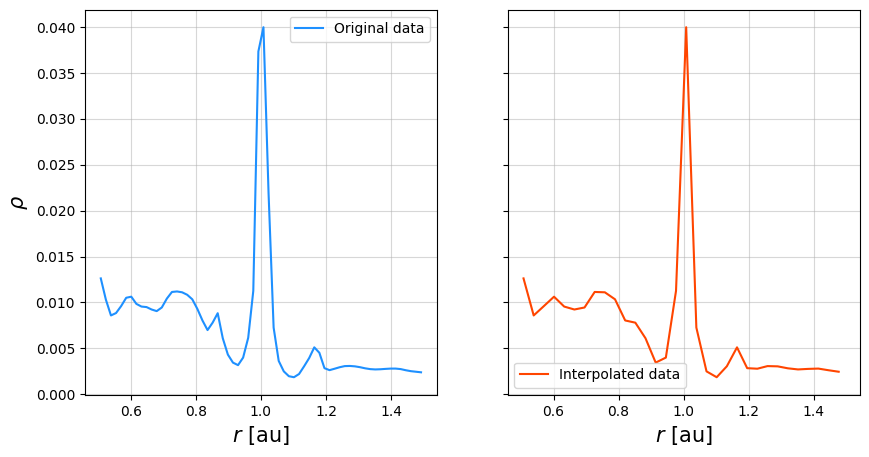

In [9]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True)
axs[0].plot(r_data, gasdens, color='dodgerblue', label='Original data')
axs[1].plot(r_data, dens1d_interp, color='orangered', label='Interpolated data')

for i in range(2):
    axs[i].grid(alpha=0.5)
    axs[i].legend()
    axs[i].set_xlabel(f'$r$ [au]', size=15)
    axs[0].set_ylabel(r'$\rho$', size=15)

plt.show()

In [10]:
# Filter out NaN values in dens1d_interp and gasdens
mask = ~(
    np.isnan(dens1d_interp) | np.isnan(gasdens)
)
dens1d_interp_clean = dens1d_interp[mask]
gasdens_clean = gasdens[mask]

# Compute RMS for 1D interpolation
rms_1d = np.sqrt(np.mean((dens1d_interp_clean - gasdens_clean)**2))
relative_rms_1d = rms_1d / np.mean(gasdens_clean) * 100

print(f"Absolute RMS (1D): {rms_1d:.1e}")
print(f"Relative RMS (1D): {relative_rms_1d:.4f}%")
print(f"Mean value of original density: {np.mean(gasdens_clean):.6e}")
print(f"Standard deviation of original density: {np.std(gasdens_clean):.6e}")

Absolute RMS (1D): 1.5e-03
Relative RMS (1D): 21.0572%
Mean value of original density: 7.312543e-03
Standard deviation of original density: 6.876309e-03


In [11]:
# Additional error metrics for 1D interpolation (logarithmic scale)
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Avoid log(0) by setting a small floor value
eps = 1e-12
log_gasdens_clean = np.log10(np.clip(gasdens_clean, eps, None))
log_dens1d_interp_clean = np.log10(np.clip(dens1d_interp_clean, eps, None))

mae_1d_log = mean_absolute_error(log_gasdens_clean, log_dens1d_interp_clean)
mse_1d_log = mean_squared_error(log_gasdens_clean, log_dens1d_interp_clean)
rmse_1d_log = np.sqrt(mse_1d_log)

print(f"MAE (1D, log10): {mae_1d_log:.3e}")
print(f"MSE (1D, log10): {mse_1d_log:.3e}")
print(f"RMSE (1D, log10): {rmse_1d_log:.3e}")

MAE (1D, log10): 1.569e-02
MSE (1D, log10): 1.307e-03
RMSE (1D, log10): 3.615e-02


### 1D Interpolation Metrics Analysis (Logarithmic Scale)

The 1D interpolation metrics calculated using the base-10 logarithm of the data are:

- **MAE (1D, log10):** 1.569e-02
- **MSE (1D, log10):** 1.307e-03
- **RMSE (1D, log10):** 3.615e-02

By analyzing the errors in log scale, we account for the wide dynamic range of the data (from $10^{-6}$ to $10^{-1}$). The low values of MAE and RMSE in log10 units indicate that the interpolation is accurate across the full range of densities. This approach ensures that errors in both low and high density regions are treated comparably, making the assessment more robust for scientific analysis.

# *2D Interpolation*

In [12]:
data2d = sim.load_field(
    fields='gasdens',
    snapshot=10,
    slice='phi=0',
    interpolate=True
)

gasdens = data2d.gasdens_mesh[0]
XS = data2d.var1_mesh[0]
YS = data2d.var2_mesh[0]
ZS = data2d.var3_mesh[0]


In [13]:
resf = 2

df_resampled = data2d.copy()
# Subsample the mesh arrays for lower resolution
df_resampled['var1_mesh'] = df_resampled['var1_mesh'].apply(lambda arr: arr[::resf, ::resf])
df_resampled['var2_mesh'] = df_resampled['var2_mesh'].apply(lambda arr: arr[::resf, ::resf])
df_resampled['var3_mesh'] = df_resampled['var3_mesh'].apply(lambda arr: arr[::resf, ::resf])
df_resampled['gasdens_mesh'] = df_resampled['gasdens_mesh'].apply(lambda arr: arr[::resf, ::resf])

In [14]:
df_resampled.var1_mesh[0].shape

(16, 32)

In [15]:
xrs = df_resampled.var1_mesh[0]
yrs = df_resampled.var2_mesh[0]
zrs = df_resampled.var3_mesh[0]
dens2drs = df_resampled.gasdens_mesh[0]


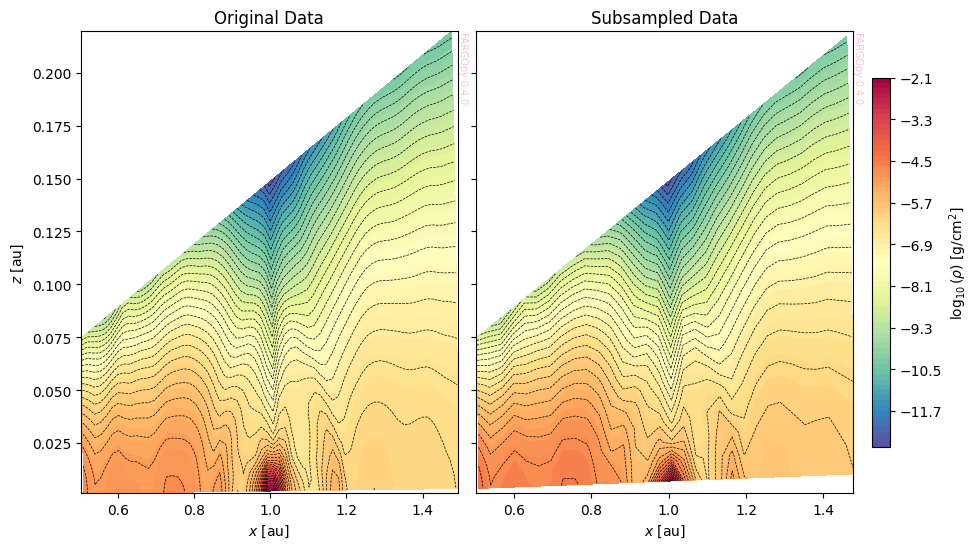

In [16]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6), sharey=True, gridspec_kw={'width_ratios': [1, 1], 'wspace': 0.05})

cmap = 'Spectral_r'

# Original data
pc1 = axs[0].contourf(XS, ZS, np.log(gasdens), cmap=cmap, levels=100)
axs[0].contour(XS, ZS, np.log(gasdens), levels=50, colors='k', linewidths=0.5)
axs[0].set_xlabel('$x$ [au]')
axs[0].set_ylabel('$z$ [au]')
axs[0].set_title('Original Data')
fp.Plot.fargopy_mark(axs[0])

# Subsampled data
pc2 = axs[1].contourf(xrs, zrs, np.log(dens2drs), cmap=cmap, levels=100)
axs[1].contour(xrs, zrs, np.log(dens2drs), levels=50, colors='k', linewidths=0.5)
axs[1].set_xlabel('$x$ [au]')
axs[1].set_title('Subsampled Data')
fp.Plot.fargopy_mark(axs[1])

# Shared colorbar
cbar = fig.colorbar(pc2, ax=axs, location='right', shrink=0.8, pad=0.02)
cbar.set_label(r'$\log_{10}(\rho)$ [g/cm$^2$]')

plt.tight_layout()
plt.show()

In [17]:
rho2d_interp = data2d.evaluate(
    time=10,
    dataframe=df_resampled,
    var1=XS,
    var3=ZS,
)

Running FARGOpy version 0.4.0


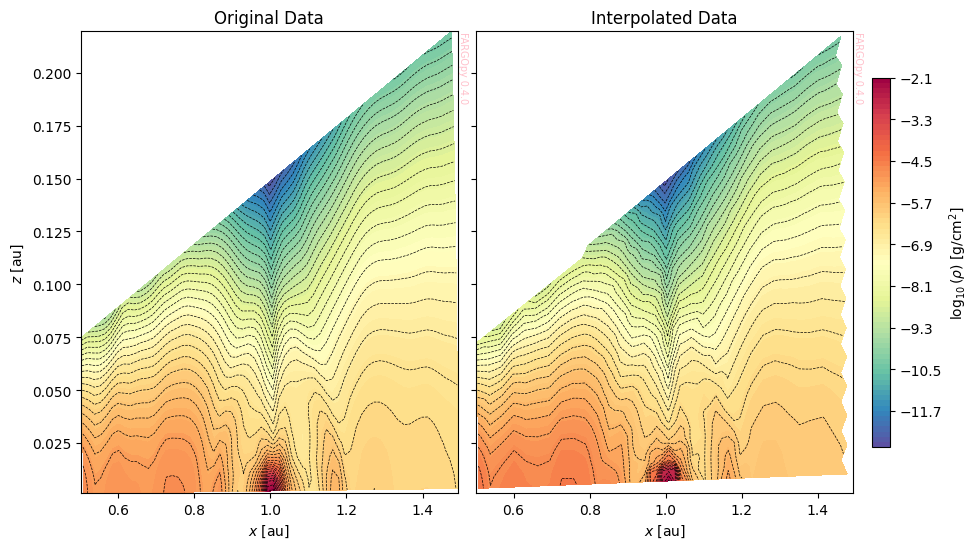

In [18]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6), sharey=True, gridspec_kw={'width_ratios': [1, 1], 'wspace': 0.05})

cmap = 'Spectral_r'

# Original data
pc1 = axs[0].contourf(XS, ZS, np.log(gasdens), cmap=cmap, levels=100)
axs[0].contour(XS, ZS, np.log(gasdens), levels=50, colors='k', linewidths=0.5)
axs[0].set_xlabel('$x$ [au]')
axs[0].set_ylabel('$z$ [au]')
axs[0].set_title('Original Data')
fp.Plot.fargopy_mark(axs[0])

# Interpolated data
pc2 = axs[1].contourf(XS, ZS, np.log(rho2d_interp), cmap=cmap, levels=100)
axs[1].contour(XS, ZS, np.log(rho2d_interp), levels=50, colors='k', linewidths=0.5)
axs[1].set_xlabel('$x$ [au]')
axs[1].set_title('Interpolated Data')
fp.Plot.fargopy_mark(axs[1])

# Shared colorbar
cbar = fig.colorbar(pc2, ax=axs, location='right', shrink=0.8, pad=0.02)
cbar.set_label(r'$\log_{10}(\rho)$ [g/cm$^2$]')

plt.tight_layout()
plt.show()

In [19]:
# Error metrics for 2D interpolation (evaluate on original grid, logarithmic scale)
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Evaluate interpolation at original grid points
rho2d_interp_on_orig = data2d.evaluate(
    time=10,
    dataframe=df_resampled,
    var1=XS,
    var3=ZS
)

# Flatten arrays and filter valid values
orig_2d = gasdens.flatten()
interp_2d = rho2d_interp_on_orig.flatten()
mask_2d = np.isfinite(orig_2d) & np.isfinite(interp_2d)
orig_2d_clean = orig_2d[mask_2d]
interp_2d_clean = interp_2d[mask_2d]

# Avoid log(0) by setting a small floor value
eps = 1e-12
log_orig_2d_clean = np.log10(np.clip(orig_2d_clean, eps, None))
log_interp_2d_clean = np.log10(np.clip(interp_2d_clean, eps, None))

mae_2d_log = mean_absolute_error(log_orig_2d_clean, log_interp_2d_clean)
mse_2d_log = mean_squared_error(log_orig_2d_clean, log_interp_2d_clean)
rmse_2d_log = np.sqrt(mse_2d_log)

print(f"MAE (2D, log10): {mae_2d_log:.3e}")
print(f"MSE (2D, log10): {mse_2d_log:.3e}")
print(f"RMSE (2D, log10): {rmse_2d_log:.3e}")

Running FARGOpy version 0.4.0
MAE (2D, log10): 1.030e-02
MSE (2D, log10): 6.059e-04
RMSE (2D, log10): 2.462e-02


In [20]:
interp_2d.shape

(2048,)

# 3D Interpolation

In [21]:
data3d = sim.load_field(
    fields='gasdens',
    snapshot=10,
    interpolate=True
)

gasdens = data3d.gasdens_mesh[0]
XS= data3d.var1_mesh[0]
YS= data3d.var2_mesh[0]
ZS= data3d.var3_mesh[0]

Loading density field


In [22]:
resf = 2

df_resampled = data3d.copy()
# Subsample the mesh arrays for lower resolution
df_resampled['var1_mesh'] = df_resampled['var1_mesh'].apply(lambda arr: arr[::resf, ::resf,::resf])
df_resampled['var2_mesh'] = df_resampled['var2_mesh'].apply(lambda arr: arr[::resf, ::resf,::resf])
df_resampled['var3_mesh'] = df_resampled['var3_mesh'].apply(lambda arr: arr[::resf, ::resf,::resf])
df_resampled['gasdens_mesh'] = df_resampled['gasdens_mesh'].apply(lambda arr: arr[::resf, ::resf,::resf])

In [23]:


rho3d_interp_on_orig = data3d.evaluate(
    time=10,
    dataframe=df_resampled,
    var1=XS,
    var2=YS,
    var3=ZS,
    interpolator = 'idw',
    idw_kwargs = {'power': 4, 'k': 100}
)

Running FARGOpy version 0.4.0


In [25]:
# Real data
fig = go.Figure()

fig.add_trace(go.Scatter3d(
    x=XS.flatten(),
    y=YS.flatten(),
    z=ZS.flatten(),
    mode='markers',
    marker=dict(
        size=4,
        color=np.log(gasdens.flatten()),
        colorscale='Spectral_r',
        opacity=0.4,
        colorbar=dict(title='Density [g/cm$^3$]'),
    ),
    name='Original'
))

# Resampled data
fig.add_trace(go.Scatter3d(
    x=df_resampled.var1_mesh[0].flatten(),
    y=df_resampled.var2_mesh[0].flatten(),
    z=df_resampled.var3_mesh[0].flatten(),
    mode='markers',
    marker=dict(
        size=4,
        color=np.log(df_resampled.gasdens_mesh[0].flatten()),
        colorscale='Spectral_r',
        opacity=0.4,
        colorbar=None,  # Only show one colorbar
    ),
    name='Resampled'
))

fig.update_layout(
    scene=dict(
        xaxis_title='X [au]',
        yaxis_title='Y [au]',
        zaxis_title='Z [au]',
        aspectmode='data'
    ),
    legend=dict(x=0.02, y=0.98)
)

fig.show()

In [26]:
# Flatten arrays and filter valid values
orig_3d = gasdens.flatten()
interp_3d = rho3d_interp_on_orig.flatten()
mask_3d = np.isfinite(orig_3d) & np.isfinite(interp_3d)
orig_3d_clean = orig_3d[mask_3d]
interp_3d_clean = interp_3d[mask_3d]

# Avoid log(0) by setting a small floor value
eps = 1e-12
log_orig_3d_clean = np.log10(np.clip(orig_3d_clean, eps, None))
log_interp_3d_clean = np.log10(np.clip(interp_3d_clean, eps, None))

mae_3d_log = mean_absolute_error(log_orig_3d_clean, log_interp_3d_clean)
mse_3d_log = mean_squared_error(log_orig_3d_clean, log_interp_3d_clean)
rmse_3d_log = np.sqrt(mse_3d_log)

print(f"MAE (3D, log10): {mae_3d_log:.3e}")
print(f"MSE (3D, log10): {mse_3d_log:.3e}")
print(f"RMSE (3D, log10): {rmse_3d_log:.3e}")

MAE (3D, log10): 1.545e-01
MSE (3D, log10): 3.715e-01
RMSE (3D, log10): 6.095e-01
